In [2]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

from components.HistoryGraph import HistoryGraph
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
import warnings
warnings.filterwarnings('ignore')
from sklearn.svm import SVC
from components.lib import execute_graph
from components.lib import view_dictionary, graphviz_draw
from components.parser.parser import extract_artifact_graph
from dictionary.Evaluator.Classification.F1_score import F1ScoreCalculator
from dictionary.Preprocessor.PCA.GPU__PCA import GPU__PCA
from dictionary.Preprocessor.PCA.GPU_SS_PCA import GPU_SS_PCA
from dictionary.Preprocessor.PCA.TR__PCA import TR__PCA
Hyppo = HistoryGraph("History")


<img src="intro.png" alt="image" width="1200" height="auto">

# Pipeline discovery with Hyppo
---

In [3]:
Hyppo.visualize(type='notebook', mode='use_alias')

In [6]:
Hyppo.view_datasets()

,dataset_id,split_ratio
0,breast_cancer,0.3
1,iris,0.3
2,diabetes,0.3
3,digits,0.3
4,wine,0.3
5,HIGGS,0.3


In [7]:
data_id = "HIGGS"

In [8]:
Hyppo.best_metrics_achieved(dataset_id=data_id)

,operator,highest_value,lowest_value
0,AccuracyCalculator,0.623333,0.515000
1,F1ScoreCalculator,0.916000,0.820667
2,MAECalculator,0.454333,0.454333


In [9]:
Hyppo.retrieve_best_pipelines(dataset_id=data_id, metric = "F1ScoreCalculator", N=3)

,F1ScoreCalculator,Pipeline
0,0.916000,"[SimpleImputer(), DecisionTreeClassifier(), F1..."
1,0.852667,"[StandardScaler(), PCA(n_components=3), Random..."
2,0.820667,"[StandardScaler(), PCA(n_components=3), Decisi..."


In [ ]:
user1_pipe = Pipeline([StandardScaler(), GPU__PCA(n_components=3), RandomForestClassifier(), F1ScoreCalculator()])

# Creating Alternative Pipelines with Hyppo
---

In [10]:
Hyppo.popular_operators(dataset_id=data_id)

,Operator,Frequency
0,PCA(n_components=3),130
1,StandardScaler(),98
2,SimpleImputer(),60
5,DecisionTreeClassifier(),24
6,F1ScoreCalculator,24
7,SVC(),18
8,AccuracyCalculator,18
9,RandomForestClassifier(random_state=42),12
10,MAECalculator,12


In [11]:
view_dictionary()

,Type,Objective,Implementation
0,Estimator,Classification,TF__MLP
1,Estimator,Classification,TR__MLP
2,Estimator,Classification,GL_LibSVMEstimator
3,Estimator,Classification,PolynomialSVM_TensorFlow
4,Estimator,Classification,SVM_PyTorch
5,Estimator,Classification,SVM_TensorFlow
6,Estimator,Classification,TF_SV
7,Estimator,Ensembles,CustomAverageEnsemble
8,Estimator,Ensembles,CustomStackingEnsemble
9,Estimator,Ensembles,StackingEnsemble


Dictionary can be filter by defining type [Preprocessor, Estimator, Evaluator]  and objective like [PCA, Classification, Regression]

In [12]:
view_dictionary(type= "Preprocessor", objective="PCA")

,Type,Objective,Implementation
27,Preprocessor,PCA,GPU_SS_PCA
28,Preprocessor,PCA,GPU__PCA
29,Preprocessor,PCA,PCA_TensorFlow
30,Preprocessor,PCA,TR__PCA


In [13]:
view_dictionary(type= "Estimator", objective="Classification")

,Type,Objective,Implementation
0,Estimator,Classification,TF__MLP
1,Estimator,Classification,TR__MLP
2,Estimator,Classification,GL_LibSVMEstimator
3,Estimator,Classification,PolynomialSVM_TensorFlow
4,Estimator,Classification,SVM_PyTorch
5,Estimator,Classification,SVM_TensorFlow
6,Estimator,Classification,TF_SV


In [14]:
Hyppo.compareHistoryAgainstDictionary(dataset_id=data_id, objective="PCA")

,Implementation,Frequency
27,GPU_SS_PCA,57
28,GPU__PCA,27
29,PCA_TensorFlow,49
30,TR__PCA,65


In [15]:
%%time
user1_pipe = Pipeline([('scaler', StandardScaler()), ('pca', GPU__PCA(n_components=3)), ('SVC', SVC()), ('F1', F1ScoreCalculator())])
Hyppo.execute_and_add(data_id, user1_pipe)

F1 Score:  0.8864000000000001
Wall time: 3.52 s


('HISKStGPPCSKSVSKF12886_score',
 Pipeline(steps=[('scaler', StandardScaler()), ('pca', GPU__PCA(n_components=3)),
                 ('SVC', SVC()), ('F1', F1ScoreCalculator())]))

# Pipeline optimization with Hyppo
---

In [16]:
%%time
optimized_pipe = Hyppo.optimize_pipeline(data_id, user1_pipe)
compute_tasks, load_tasks, request = execute_graph('HIGGS', optimized_pipe)
request

Wall time: 28 ms


0.8864000000000001

In [17]:
load_tasks

['HISKStGPPCSKSVSKF12886_score']

In [18]:
compute_tasks

[['F1ScoreCalculator.score']]

# Extending Dictionary

In [19]:
%%writefile dictionary/Evaluator/Classification/F2ScoreCalculator.py
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.metrics import fbeta_score

class F2ScoreCalculator(BaseEstimator, TransformerMixin):
    def __init__(self, y_true=None, average='micro'):
        self.y_true = y_true
        self.average = average

    def fit(self, X, y=None):
        self.y_true = X
        return self

    def score(self, X):
        f2 = fbeta_score(self.y_true, X, beta=2, average=self.average)
        return f2

Writing dictionary/Evaluator/Classification/F2ScoreCalculator.py


In [20]:
from dictionary.Evaluator.Classification.F2ScoreCalculator import F2ScoreCalculator

In [21]:
%%time
user1_pipe = Pipeline([('scaler', StandardScaler()), ('pca', GPU__PCA(n_components=3)), ('SVC', SVC()), ('F2', F2ScoreCalculator())])
Hyppo.execute_and_add(data_id, user1_pipe)

Wall time: 3.6 s


('HISKStGPPCSKSVSKF22886_score',
 Pipeline(steps=[('scaler', StandardScaler()), ('pca', GPU__PCA(n_components=3)),
                 ('SVC', SVC()), ('F2', F2ScoreCalculator())]))

In [22]:
Hyppo.best_metrics_achieved(dataset_id=data_id)

,operator,highest_value,lowest_value
0,AccuracyCalculator,0.623333,0.515000
1,F1ScoreCalculator,0.916000,0.820667
2,MAECalculator,0.454333,0.454333
3,F2ScoreCalculator,0.586400,0.586400


In [23]:
Hyppo.retrieve_best_pipeline(dataset_id=data_id, metric="F2ScoreCalculator")

['StandardScaler()', 'GPU__PCA(n_components=3)', 'SVC()', 'F2ScoreCalculator']

---
The process of Discovery, Modification and Optimization pipelines continues iteratively until a satisfactory level of perfromance is achieved.

#  Hyppo Overview
![alt text](HYPPO_v3.png)

### 1) Parser

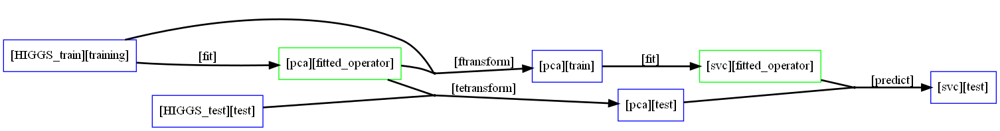

'HISKPCSKSV9009_predict'

In [24]:
from components.lib import graphviz_draw

user1_pipe = Pipeline([('pca', PCA(n_components=3)), ('svc', SVC())])
artifact_graph, request = extract_artifact_graph(data_id, user1_pipe)
graphviz_draw(artifact_graph, type='notebook',  mode='use_alias')
request

### 2) Augmenter

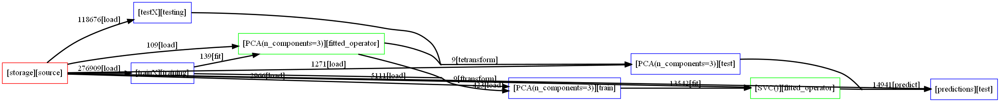

In [25]:
Hyppo.visualize_augmented(data_id, type='notebook', mode='use_alias', filter_artifact_id="HISKPCSKSV9009_predict", filter = 'retrieve')

### 3) Plan Generator

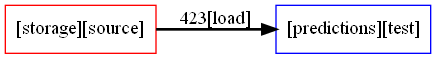

In [26]:
pipe = Hyppo.optimal_retrieval_plan(data_id,["HISKPCSKSV9009_predict"])
graphviz_draw(pipe[0][1], 'notebook','use_alias')